In [1]:
!pip install ultralytics opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.6 MB/s eta 0:00:00


In [2]:
from google.colab import files

uploaded = files.upload()

Saving dataset.zip to dataset.zip


In [3]:
import zipfile, os

zip_path = "dataset.zip"  # name of uploaded file
extract_dir = "/content/dataset"

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(extract_dir)

print("Extracted files:")
print(os.listdir(extract_dir))

Extracted files:
['dataset']


In [4]:
import shutil, os

# Path to the original folder
nested = "/content/dataset/dataset"

# Displace files & folders up one level
for item in os.listdir(nested):
    shutil.move(os.path.join(nested, item), "/content/dataset")

# Remove the empty inside folder
shutil.rmtree(nested)

print("Fixed structure:")
print(os.listdir("/content/dataset"))

Fixed structure:
['test', 'valid', 'data.yaml', 'evaluation', 'train']


In [5]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

results = model.train(
    data="/content/dataset/data.yaml",
    epochs=110,
    batch=4,
    imgsz=960,
    name="pcb_yolo11n",
    project="runs/detect",
    device=0,
    workers=2,
    verbose=True
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=110, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False,

In [6]:
from ultralytics import YOLO
import glob

# Load model
model = YOLO("/content/runs/detect/pcb_yolo11n/weights/best.pt")

eval_folder = "/content/dataset/evaluation"

results = model.predict(
    source=eval_folder,
    imgsz=960,
    conf=0.25,
    save=True,
    project="runs/eval",
    name="pcb_eval",
    device=0,
    verbose=True
)

print("Done")


image 1/3 /content/dataset/evaluation/ardmega.jpg: 864x960 1 Button, 11 Capacitors, 5 Connectors, 7 ICs, 17 Resistors, 73.4ms
image 2/3 /content/dataset/evaluation/arduno.jpg: 672x960 15 Capacitors, 10 Connectors, 1 Diode, 2 Electrolytic Capacitors, 4 ICs, 3 Leds, 1 Pads, 13 Resistors, 1 Switch, 79.2ms
image 3/3 /content/dataset/evaluation/rasppi.jpg: 640x960 9 Capacitors, 13 Connectors, 1 Electrolytic Capacitor, 12 ICs, 1 Led, 17 Resistors, 79.8ms
Speed: 8.7ms preprocess, 77.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 960)
Results saved to /content/runs/eval/pcb_eval
Done


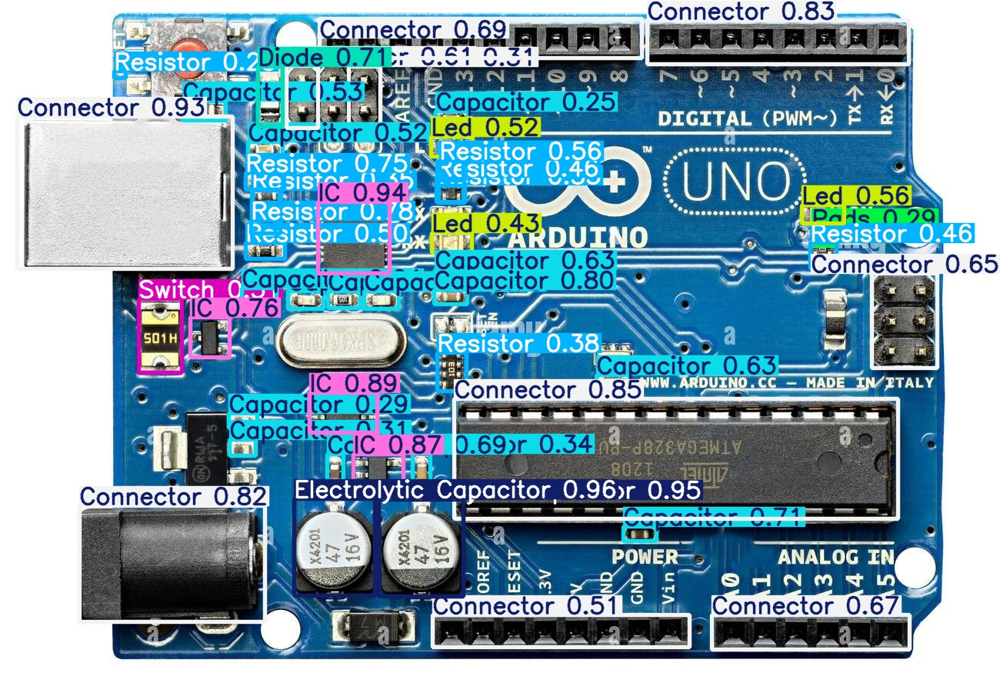

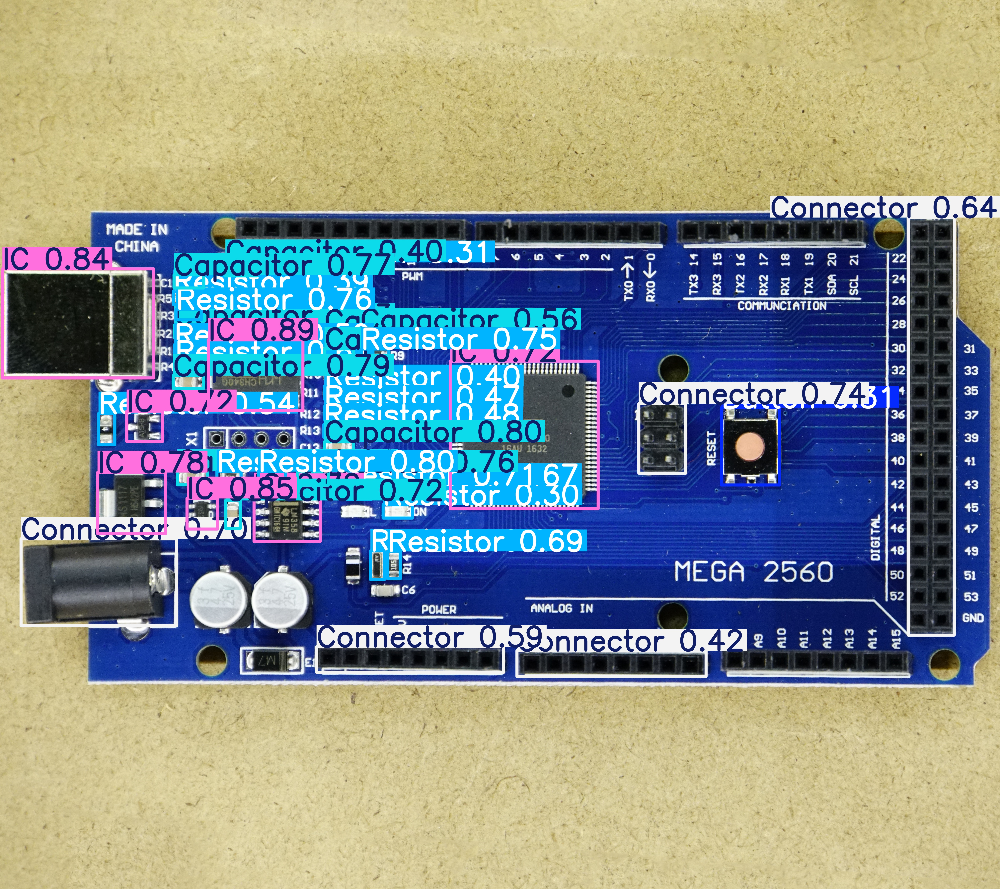

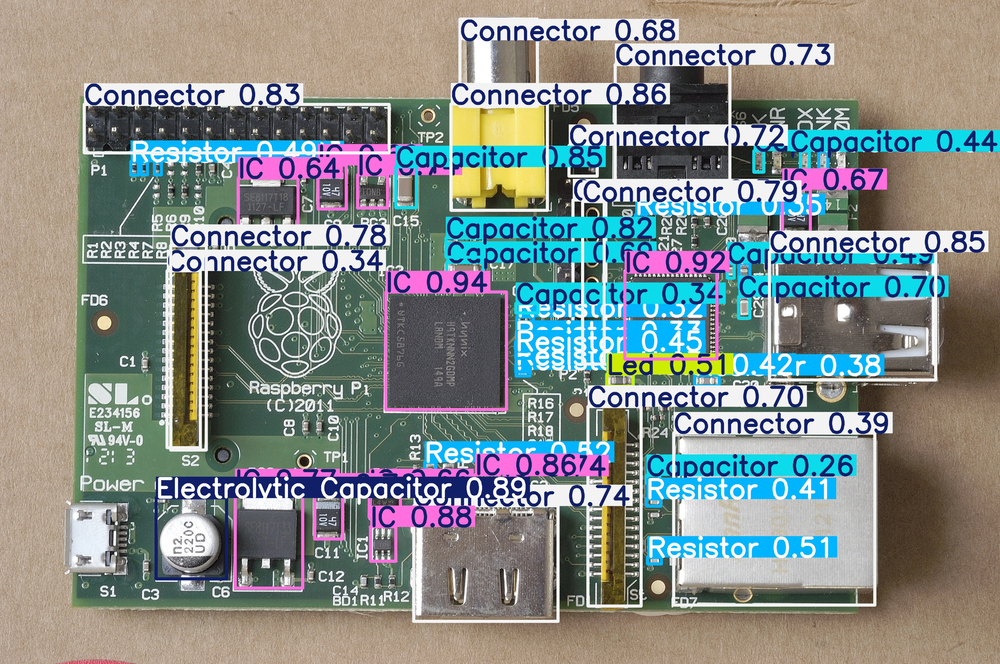

In [7]:
from IPython.display import Image, display
import glob

eval_dir = "/content/runs/eval/pcb_eval"

for img in glob.glob(f"{eval_dir}/*"):
    display(Image(img))

In [8]:
!zip -r pcb_eval_results.zip /content/runs/eval/pcb_eval
from google.colab import files
files.download("pcb_eval_results.zip")

  adding: content/runs/eval/pcb_eval/ (stored 0%)
  adding: content/runs/eval/pcb_eval/arduno.jpg (deflated 3%)
  adding: content/runs/eval/pcb_eval/ardmega.jpg (deflated 1%)
  adding: content/runs/eval/pcb_eval/rasppi.jpg (deflated 1%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>